In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow import keras
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import LSTM, Dense

data=pd.read_csv('xyz_sales_data.csv')
data[['Date','Order_Quantity']]
data=data.set_index("Date")

data1=data[['Order_Quantity']]
grouped_data=data1.groupby('Date',sort=True).sum()
print([grouped_data])


[            Order_Quantity
Date                      
01-01-2011               8
01-01-2012              10
01-01-2013               8
01-01-2014            1100
01-01-2015              12
...                    ...
31-10-2015            1476
31-12-2011              13
31-12-2012              14
31-12-2013            2735
31-12-2015            2664

[1884 rows x 1 columns]]


In [16]:
#Normalize the scales data
scaler = MinMaxScaler()
data1['Order_Quantity']=scaler.fit_transform(data1['Order_Quantity'].values.reshape(-1,1))

C:\Users\10725938\AppData\Local\Temp\ipykernel_21416\3794928079.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1['Order_Quantity']=scaler.fit_transform(data1['Order_Quantity'].values.reshape(-1,1))


In [17]:
# print(data['sales'])
# Split the data into training and testing sets
train_size = int(len(data1)*0.7)
train_data,test_data = data1[:train_size],data1[train_size:]

print(train_data)
print(test_data)

            Order_Quantity
Date                      
26-11-2013        0.225806
26-11-2015        0.225806
23-03-2014        0.709677
23-03-2016        0.612903
15-05-2014        0.096774
...                    ...
04-01-2014        0.064516
04-01-2014        0.225806
04-01-2016        0.000000
04-01-2016        0.193548
25-01-2014        0.290323

[79125 rows x 1 columns]
            Order_Quantity
Date                      
25-01-2014        0.000000
25-01-2016        0.290323
25-01-2016        0.000000
12-04-2014        0.354839
12-04-2014        0.193548
...                    ...
12-04-2016        0.064516
02-04-2014        0.677419
02-04-2016        0.677419
04-03-2014        0.741935
04-03-2016        0.709677

[33911 rows x 1 columns]


In [18]:
# Create sequence of data for training
def create_sequence(data,sequence_length):
    sequences,labels = [],[]
    for i in range(len(data)-sequence_length):
        sequence = data.iloc[i:i+sequence_length]['Order_Quantity']
        target = data.iloc[i+sequence_length]['Order_Quantity']
        sequences.append(sequence)
        labels.append(target)
        print("Sequences:{}".format(sequence))
        print("labels:{}".format(target))
    return np.array(sequences),np.array(labels)


sequence_length = 1 #you can adjust this based on your data
X_train, y_train = create_sequence(train_data, sequence_length)
X_test, y_test = create_sequence(test_data, sequence_length)

Sequences:Date
26-11-2013    0.225806
Name: Order_Quantity, dtype: float64
labels:0.22580645161290322
Sequences:Date
26-11-2015    0.225806
Name: Order_Quantity, dtype: float64
labels:0.7096774193548387
Sequences:Date
23-03-2014    0.709677
Name: Order_Quantity, dtype: float64
labels:0.6129032258064516
Sequences:Date
23-03-2016    0.612903
Name: Order_Quantity, dtype: float64
labels:0.0967741935483871
Sequences:Date
15-05-2014    0.096774
Name: Order_Quantity, dtype: float64
labels:0.12903225806451613
Sequences:Date
15-05-2016    0.129032
Name: Order_Quantity, dtype: float64
labels:0.0967741935483871
Sequences:Date
22-05-2014    0.096774
Name: Order_Quantity, dtype: float64
labels:0.03225806451612903
Sequences:Date
22-05-2016    0.032258
Name: Order_Quantity, dtype: float64
labels:0.6774193548387097
Sequences:Date
22-02-2014    0.677419
Name: Order_Quantity, dtype: float64
labels:0.6451612903225806
Sequences:Date
22-02-2016    0.645161
Name: Order_Quantity, dtype: float64
labels:0.2258

In [19]:
#Build the LSTM model
model = Sequential()
model.add(LSTM(50,  activation='relu', input_shape=(sequence_length,1)))# 50 neurons in a single layer will be created
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')#mean_squared_error thats the actual difference between actaul data and the model predicted

In [20]:
# Make prediction
type(X_test)
predicted_sales= model.predict(X_test)

1060/1060 [==============================] - 1s 978us/step


In [21]:
#Train the model
model.fit(X_train,y_train,epochs=10,batch_size=100)

Epoch 1/10
792/792 [==============================] - 3s 2ms/step - loss: 0.0690
Epoch 2/10
792/792 [==============================] - 3s 4ms/step - loss: 0.0589
Epoch 3/10
792/792 [==============================] - 3s 4ms/step - loss: 0.0570
Epoch 4/10
792/792 [==============================] - 3s 3ms/step - loss: 0.0560
Epoch 5/10
792/792 [==============================] - 2s 3ms/step - loss: 0.0557
Epoch 6/10
792/792 [==============================] - 2s 3ms/step - loss: 0.0556
Epoch 7/10
792/792 [==============================] - 3s 3ms/step - loss: 0.0555
Epoch 8/10
792/792 [==============================] - 2s 3ms/step - loss: 0.0555
Epoch 9/10
792/792 [==============================] - 2s 2ms/step - loss: 0.0554
Epoch 10/10
792/792 [==============================] - 2s 2ms/step - loss: 0.0554


In [22]:
# print(type(test_data["sales"][sequence_length:].to_numpy()))
# Inverse transform the scaled prediction
predicted_sales= scaler.inverse_transform(predicted_sales)
actual_sales= scaler.inverse_transform(test_data['Order_Quantity'][sequence_length:].to_numpy().reshape(-1,1))
print('actual_sales',actual_sales[0])
print('predicted_sales:',predicted_sales[0])

actual_sales [10.]
predicted_sales: [1.]


In [23]:
grouped_data=data1.groupby('Date').sum()
print([grouped_data])

[            Order_Quantity
Date                      
01-01-2011        0.096774
01-01-2012        0.161290
01-01-2013        0.000000
01-01-2014       32.677419
01-01-2015        0.129032
...                    ...
31-10-2015       43.709677
31-12-2011        0.193548
31-12-2012        0.225806
31-12-2013       81.774194
31-12-2015       79.483871

[1884 rows x 1 columns]]


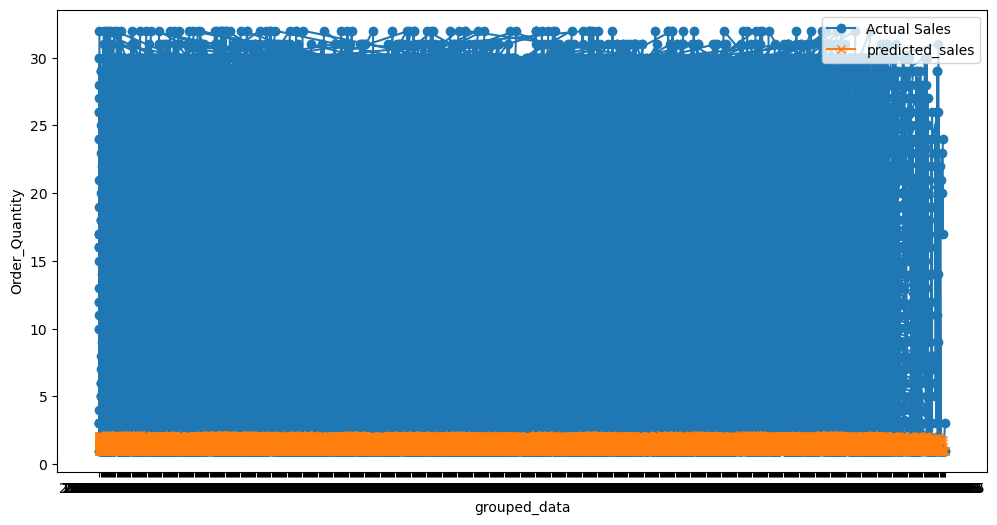

In [24]:
# plot the actual vs. predicted sales
plt.figure(figsize=(12,6))
plt.plot(test_data.index[sequence_length:],actual_sales,label='Actual Sales',marker='o')
plt.plot(test_data.index[sequence_length:],predicted_sales,label='predicted_sales', marker='x')
plt.xlabel('grouped_data')
plt.ylabel('Order_Quantity')
plt.legend()
plt.show()


In [25]:
# import matplotlib.pyplot as plt
# import numpy as np
# # plot
# x=actual_sales
# y=predicted_sales
# fig, ax = plt.subplots()

# ax.stackplot(x, y)

# ax.set(xlim=(0, 8), xticks=np.arange(1, 8),
#        ylim=(0, 8), yticks=np.arange(1, 8))

# plt.show()
